In [12]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import warnings
warnings.filterwarnings("ignore")

# 1. GENERATOR FUNCTION (Exact code given by you)
def sigmoid(x):
    return 1.0 / (1.0 + np.exp(-x))

def generate_synthetic_neuro_developmental_adata(n_cells=5000, n_genes=5000, n_branches=6, seed=42, noise_level=0.20, branch_point=0.35):
    rng = np.random.default_rng(seed)
    if n_branches != 6: raise ValueError("This version is configured for exactly 6 branches.")

    pseudotime = rng.uniform(0.0, 1.0, n_cells)
    branch_gate = sigmoid((pseudotime - branch_point) / 0.05)
    branch_names = np.array(["Excitatory_Neuron", "Inhibitory_Neuron", "Astrocyte", "Oligodendrocyte", "Microglia", "OPC"])
    branch_probs = np.array([0.24, 0.20, 0.16, 0.16, 0.12, 0.12])
    branch_idx = np.full(n_cells, -1, dtype=int)

    post_branch = np.where(pseudotime >= branch_point)[0]
    branch_idx[post_branch] = rng.choice(np.arange(n_branches), size=len(post_branch), p=branch_probs)

    lineage = np.array(["NPC"] * n_cells, dtype=object)
    for idx, name in enumerate(branch_names):
        lineage[branch_idx == idx] = name

    lineage_onehot = np.zeros((n_cells, n_branches), dtype=float)
    valid = branch_idx >= 0
    lineage_onehot[valid, branch_idx[valid]] = 1.0

    stemness = 12.0 * np.exp(-4.0 * pseudotime)
    progenitor = 9.0 * np.exp(-((pseudotime - 0.25) / 0.18) ** 2)
    pan_neural = 10.0 * sigmoid(12.0 * (pseudotime - 0.35))
    maturation = 16.0 * sigmoid(10.0 * (pseudotime - 0.55))
    neurogenesis = 8.0 * sigmoid(10.0 * (pseudotime - 0.40))
    gliogenesis = 8.0 * sigmoid(10.0 * (pseudotime - 0.45))

    excitatory = branch_gate * sigmoid(10.0 * (pseudotime - 0.45)) * (0.15 + 0.85 * lineage_onehot[:, 0])
    inhibitory = branch_gate * sigmoid(10.0 * (pseudotime - 0.45)) * (0.15 + 0.85 * lineage_onehot[:, 1])
    astrocyte = branch_gate * sigmoid(10.0 * (pseudotime - 0.47)) * (0.15 + 0.85 * lineage_onehot[:, 2])
    oligodendrocyte = branch_gate * sigmoid(10.0 * (pseudotime - 0.50)) * (0.15 + 0.85 * lineage_onehot[:, 3])
    microglia = branch_gate * sigmoid(10.0 * (pseudotime - 0.52)) * (0.15 + 0.85 * lineage_onehot[:, 4])
    opc = branch_gate * sigmoid(10.0 * (pseudotime - 0.42)) * (0.15 + 0.85 * lineage_onehot[:, 5])

    cell_cycle = 3.0 * (np.sin(4 * np.pi * pseudotime + rng.uniform(0, 2*np.pi, n_cells)) + 1.0) / 2.0
    cell_cycle *= np.exp(-((pseudotime - 0.35) / 0.25) ** 2)
    stress = 0.5 + 0.4 * rng.random(n_cells)
    immediate_early = 2.5 * sigmoid(8.0 * (pseudotime - 0.60))

    regulator_names = ["SOX2_like", "PAX6_like", "NEUROD1_like", "RBFOX3_like", "SLC17A7_like", "GAD1_like", "GFAP_like", "OLIG2_like", "AIF1_like", "PDGFRA_like", "MKI67_like", "STRESS_like", "CELL_CYCLE_like", "MATURATION_like"]
    regulator_matrix = np.column_stack([stemness, progenitor, neurogenesis, pan_neural, excitatory, inhibitory, astrocyte, oligodendrocyte, microglia, opc, cell_cycle, stress, cell_cycle, maturation]).astype(np.float32)

    spatial_x = rng.uniform(0.0, 1.0, n_cells)
    spatial_y = (1.2 * pseudotime + 0.12 * branch_idx.clip(min=0) + 0.05 * rng.normal(size=n_cells))
    spatial = np.column_stack([spatial_x, spatial_y]).astype(np.float32)

    blocks = {"stem": (0, 250), "progenitor": (250, 750), "pan_neural": (750, 1350), "exc_neuron": (1350, 1650), "inh_neuron": (1650, 1950), "astrocyte": (1950, 2250), "oligodendrocyte": (2250, 2550), "microglia": (2550, 2850), "opc": (2850, 3150), "synaptic_maturation": (3150, 3750), "glial_maturation": (3750, 4150), "housekeeping": (4150, 4600), "cell_cycle": (4600, 4850), "stress_response": (4850, 5000)}

    gene_names, gene_modules = [], []
    for module_name, (start, end) in blocks.items():
        for i in range(end - start):
            gene_names.append(f"{module_name.upper()}_Gene_{i+1:04d}")
            gene_modules.append(module_name)
    gene_names, gene_modules = np.array(gene_names, dtype=object), np.array(gene_modules, dtype=object)

    def make_block(
        profiles,
        block_size,
        base=0.15,
        scale=1.0,
        noise_sd=0.08
    ):
        P = np.column_stack(
            [np.asarray(p).reshape(-1) for p in profiles]
        )

        k = P.shape[1]

        weights = rng.gamma(
            shape=2.0,
            scale=1.0,
            size=(k, block_size)
        ).astype(np.float32)

        gene_bias = rng.gamma(
            shape=1.5,
            scale=0.25,
            size=block_size
        ).astype(np.float32)

        # expected matrix size
        n_samples = P.shape[0]

        noise = rng.normal(
            loc=0.0,
            scale=noise_sd,
            size=(n_samples, block_size)
        ).astype(np.float32)

        block = (
            base
            + scale * (P @ weights) / max(k, 1)
            + gene_bias[None, :]
            + noise
        )

        return np.clip(
            block,
            0.0,
            None
        ).astype(np.float32)

    X_mean = np.zeros((n_cells, n_genes), dtype=np.float32)
    X_mean[:, blocks["stem"][0]:blocks["stem"][1]] = make_block([stemness, progenitor], blocks["stem"][1]-blocks["stem"][0], 0.20, 0.85, noise_level*0.12)
    X_mean[:, blocks["progenitor"][0]:blocks["progenitor"][1]] = make_block([progenitor, stemness, neurogenesis], blocks["progenitor"][1]-blocks["progenitor"][0], 0.20, 0.90, noise_level*0.12)
    X_mean[:, blocks["pan_neural"][0]:blocks["pan_neural"][1]] = make_block([pan_neural, maturation], blocks["pan_neural"][1]-blocks["pan_neural"][0], 0.18, 0.95, noise_level*0.10)
    X_mean[:, blocks["exc_neuron"][0]:blocks["exc_neuron"][1]] = make_block([excitatory, maturation, pan_neural], blocks["exc_neuron"][1]-blocks["exc_neuron"][0], 0.12, 1.15, noise_level*0.10)
    X_mean[:, blocks["inh_neuron"][0]:blocks["inh_neuron"][1]] = make_block([inhibitory, maturation, pan_neural], blocks["inh_neuron"][1]-blocks["inh_neuron"][0], 0.12, 1.15, noise_level*0.10)
    X_mean[:, blocks["astrocyte"][0]:blocks["astrocyte"][1]] = make_block([astrocyte, gliogenesis], blocks["astrocyte"][1]-blocks["astrocyte"][0], 0.10, 1.10, noise_level*0.10)
    X_mean[:, blocks["oligodendrocyte"][0]:blocks["oligodendrocyte"][1]] = make_block([oligodendrocyte, maturation], blocks["oligodendrocyte"][1]-blocks["oligodendrocyte"][0], 0.10, 1.10, noise_level*0.10)
    X_mean[:, blocks["microglia"][0]:blocks["microglia"][1]] = make_block([microglia, stress, immediate_early], blocks["microglia"][1]-blocks["microglia"][0], 0.10, 1.05, noise_level*0.10)
    X_mean[:, blocks["opc"][0]:blocks["opc"][1]] = make_block([opc, oligodendrocyte, progenitor], blocks["opc"][1]-blocks["opc"][0], 0.10, 1.05, noise_level*0.10)
    X_mean[:, blocks["synaptic_maturation"][0]:blocks["synaptic_maturation"][1]] = make_block([maturation, excitatory, inhibitory, pan_neural], blocks["synaptic_maturation"][1]-blocks["synaptic_maturation"][0], 0.12, 1.00, noise_level*0.08)
    X_mean[:, blocks["glial_maturation"][0]:blocks["glial_maturation"][1]] = make_block([astrocyte, oligodendrocyte, opc, microglia], blocks["glial_maturation"][1]-blocks["glial_maturation"][0], 0.12, 1.00, noise_level*0.08)

    X_mean[:, blocks["housekeeping"][0]:blocks["housekeeping"][1]] = np.clip(4.0 + 0.25 * rng.normal(size=(n_cells, blocks["housekeeping"][1]-blocks["housekeeping"][0])).astype(np.float32) + 0.20 * (1.0 + 0.15 * cell_cycle[:, None].astype(np.float32)), 0.0, None)
    X_mean[:, blocks["cell_cycle"][0]:blocks["cell_cycle"][1]] = make_block([cell_cycle, progenitor], blocks["cell_cycle"][1]-blocks["cell_cycle"][0], 0.10, 1.20, noise_level*0.12)
    X_mean[:, blocks["stress_response"][0]:blocks["stress_response"][1]] = make_block([stress, immediate_early, branch_gate], blocks["stress_response"][1]-blocks["stress_response"][0], 0.08, 0.85, noise_level*0.12)

    batch = rng.choice(["Batch_1", "Batch_2", "Batch_3"], size=n_cells, p=[0.40, 0.35, 0.25])
    batch_shift = {"Batch_1": 0.00, "Batch_2": 0.30, "Batch_3": -0.20}
    batch_scale = {"Batch_1": 1.00, "Batch_2": 1.08, "Batch_3": 0.94}

    tech_gene_idx = np.arange(blocks["housekeeping"][0], blocks["housekeeping"][1])
    for b in batch_shift:
        idx = np.where(batch == b)[0]
        if len(idx) > 0:
            X_mean[np.ix_(idx, tech_gene_idx)] = (X_mean[np.ix_(idx, tech_gene_idx)] * batch_scale[b]) + batch_shift[b]

    library_size = rng.lognormal(mean=0.0, sigma=0.18, size=n_cells).astype(np.float32)
    X_mean_final = X_mean * library_size[:, None]
    X_mean_final = np.clip(X_mean_final + rng.normal(0.0, noise_level, size=X_mean_final.shape).astype(np.float32), 0.0, None)

    # Fix 3: Sort pseudotime before gradient for developmental_change
    sort_idx = np.argsort(pseudotime)
    tmp_stemness = stemness[sort_idx]
    tmp_progenitor = progenitor[sort_idx]
    tmp_pan_neural = pan_neural[sort_idx]
    tmp_maturation = maturation[sort_idx]

    tmp_developmental_change = (
        np.abs(np.gradient(tmp_stemness))
        + np.abs(np.gradient(tmp_progenitor))
        + np.abs(np.gradient(tmp_pan_neural))
        + np.abs(np.gradient(tmp_maturation))
    )
    developmental_change = np.zeros_like(tmp_developmental_change)
    developmental_change[sort_idx] = tmp_developmental_change

    developmental_change /= (developmental_change.max() + 1e-8)
    velocity_driver = 0.35 + 1.25 * developmental_change + 0.20 * branch_gate.astype(np.float32)

    unspliced_mean = np.clip(0.28 * X_mean_final + velocity_driver[:, None] * (0.8 + 0.4 * rng.random((n_cells, n_genes)).astype(np.float32)), 0.0, None)
    spliced_counts = rng.poisson(lam=X_mean_final).astype(np.float32)
    unspliced_counts = rng.poisson(lam=unspliced_mean).astype(np.float32)

    dropout_rate = np.clip(0.35 + noise_level * 0.25, 0.15, 0.70)
    spliced_counts *= rng.binomial(1, 1.0 - dropout_rate, size=spliced_counts.shape).astype(np.float32)
    unspliced_counts *= rng.binomial(1, 1.0 - (dropout_rate + 0.05), size=unspliced_counts.shape).astype(np.float32)

    obs = pd.DataFrame({"pseudotime": pseudotime.astype(np.float32), "branch_gate": branch_gate.astype(np.float32), "lineage": lineage, "branch_index": branch_idx.astype(np.int32), "batch": batch, "library_size_factor": library_size.astype(np.float32), "cell_cycle_score": cell_cycle.astype(np.float32), "stress_score": stress.astype(np.float32), "spatial_x": spatial[:, 0], "spatial_y": spatial[:, 1]}, index=[f"cell_{i:05d}" for i in range(n_cells)])
    var = pd.DataFrame(index=gene_names)
    var["module"] = gene_modules
    var["mean_expression"] = spliced_counts.mean(axis=0).astype(np.float32)
    var["mean_unspliced"] = unspliced_counts.mean(axis=0).astype(np.float32)

    adata = sc.AnnData(X=spliced_counts.astype(np.float32), obs=obs, var=var)
    adata.layers["spliced"] = spliced_counts.astype(np.float32)
    adata.layers["unspliced"] = unspliced_counts.astype(np.float32)
    adata.obsm["spatial"] = spatial
    # Fix 2: Change X_latent to X_ground_truth using regulator_matrix
    adata.obsm["X_ground_truth"] = regulator_matrix # Using regulator_matrix as X_ground_truth
    adata.uns["synthetic_config"] = {
        "n_cells": n_cells,
        "n_genes": n_genes,
        "n_branches": n_branches,
        "seed": seed,
        "noise_level": noise_level,
        "branch_point": branch_point,
        "regulator_names": regulator_names
    } # Adding metadata/config
    return adata

# Data Initialization
adata = generate_synthetic_neuro_developmental_adata(n_cells=5000, n_genes=5000)

# 2. ADVANCED PIPELINE PREPROCESSING (Dual 2D/3D Graph Abstraction)
adata_pp = adata.copy()
sc.pp.normalize_total(adata_pp, target_sum=1e4)
sc.pp.log1p(adata_pp)
sc.pp.highly_variable_genes(adata_pp, n_top_genes=2000, flavor="seurat")
adata_pp = adata_pp[:, adata_pp.var["highly_variable"]].copy()
sc.pp.scale(adata_pp, max_value=10)

# Fix 4: Use sc.pp.pca instead of sc.tl.pca for compatibility
sc.pp.pca(adata_pp, n_comps=50)
sc.pp.neighbors(adata_pp, n_neighbors=20, n_pcs=30)

# Compute standard 2D UMAP for timeline snapshots
sc.tl.umap(adata_pp, n_components=2)

# Compute specialized 3D UMAP for topology landscape (Stored in a separate slot)
# This prevents overwriting the main 2D coordinate space
adata_3d = adata_pp.copy()
sc.tl.umap(adata_3d, n_components=3)
adata_pp.obsm["X_umap3d"] = adata_3d.obsm["X_umap"]

In [3]:
!pip install scanpy

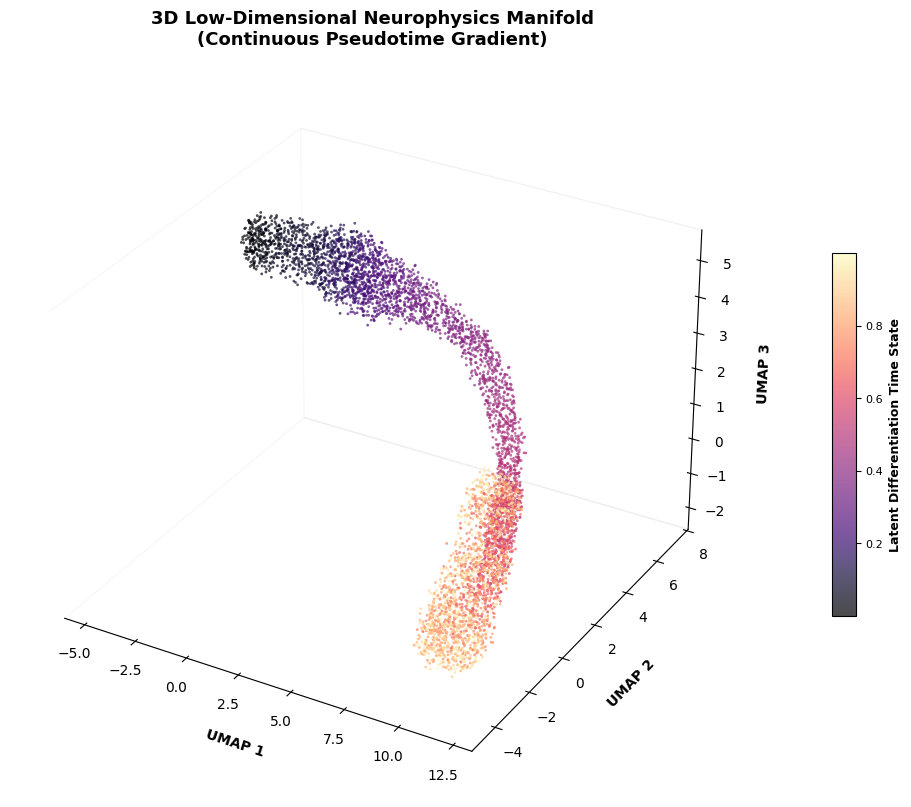

In [4]:
fig = plt.figure(figsize=(10, 8), facecolor='white')
ax = fig.add_subplot(111, projection='3d')

# Custom color mapping for deep premium aesthetic
scatter = ax.scatter(
    adata_pp.obsm["X_umap3d"][:, 0],
    adata_pp.obsm["X_umap3d"][:, 1],
    adata_pp.obsm["X_umap3d"][:, 2],
    c=adata_pp.obs["pseudotime"],
    cmap="magma",
    s=4,
    alpha=0.7,
    edgecolors='none'
)

# Minimal grid setup (Quiet Luxury feel)
ax.grid(False)
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

ax.set_xlabel("UMAP 1", fontsize=10, fontweight='bold', labelpad=10)
ax.set_ylabel("UMAP 2", fontsize=10, fontweight='bold', labelpad=10)
ax.set_zlabel("UMAP 3", fontsize=10, fontweight='bold', labelpad=10)
ax.set_title("3D Low-Dimensional Neurophysics Manifold\n(Continuous Pseudotime Gradient)", fontsize=13, fontweight='bold', pad=20)

cbar = fig.colorbar(scatter, ax=ax, shrink=0.5, aspect=15, pad=0.1)
cbar.set_label("Latent Differentiation Time State", fontsize=9, fontweight='bold')
cbar.ax.tick_params(labelsize=8)

plt.tight_layout()
plt.show()

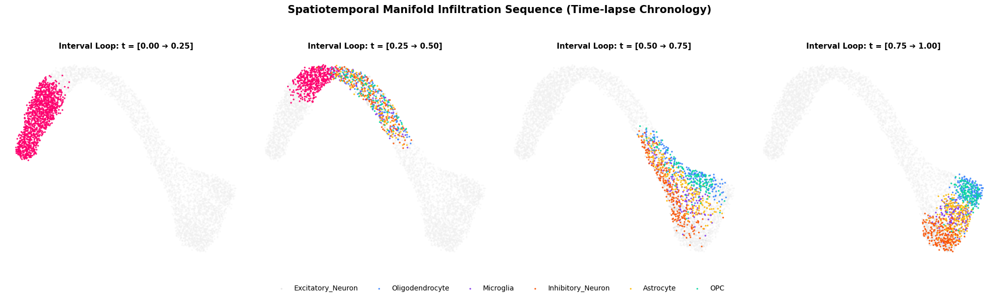

In [5]:
time_snapshots = [(0.0, 0.25), (0.25, 0.50), (0.50, 0.75), (0.75, 1.00)]
fig, axes = plt.subplots(1, 4, figsize=(20, 5), sharex=True, sharey=True, facecolor='white')

# Set standard categorical colors for unique lineages
unique_lineages = list(adata_pp.obs["lineage"].unique())
colors_list = ["#E5E5E5", "#3A86FF", "#8338EC", "#FF006E", "#FB5607", "#FFBE0B", "#06D6A0"]
color_map = {lineage: colors_list[i] for i, lineage in enumerate(unique_lineages)}

for i, (t_min, t_max) in enumerate(time_snapshots):
    ax = axes[i]

    # Background baseline layer (all cells faded out for contrast context)
    ax.scatter(adata_pp.obsm["X_umap"][:, 0], adata_pp.obsm["X_umap"][:, 1], c="#F0F0F0", s=2, alpha=0.3)

    # Active cells tracking current snapshot interval
    mask = (adata_pp.obs["pseudotime"] >= t_min) & (adata_pp.obs["pseudotime"] <= t_max)
    sub_df = adata_pp[mask]

    for lin in unique_lineages:
        lin_mask = sub_df.obs["lineage"] == lin
        if lin_mask.sum() > 0:
            ax.scatter(
                sub_df.obsm["X_umap"][lin_mask, 0],
                sub_df.obsm["X_umap"][lin_mask, 1],
                label=lin if i == 3 else "",  # Legend only on final frame
                c=color_map[lin],
                s=6,
                alpha=0.9,
                edgecolors='none'
            )

    ax.set_title(f"Interval Loop: t = [{t_min:.2f} ➔ {t_max:.2f}]", fontsize=11, fontweight='bold', pad=10)
    ax.axis("off")

# Clean formatting legend setup
fig.suptitle("Spatiotemporal Manifold Infiltration Sequence (Time-lapse Chronology)", fontsize=15, fontweight='bold', y=1.05)
fig.legend(loc="lower center", bbox_to_anchor=(0.5, -0.12), ncol=7, frameon=False, fontsize=10)
plt.tight_layout()
plt.show()

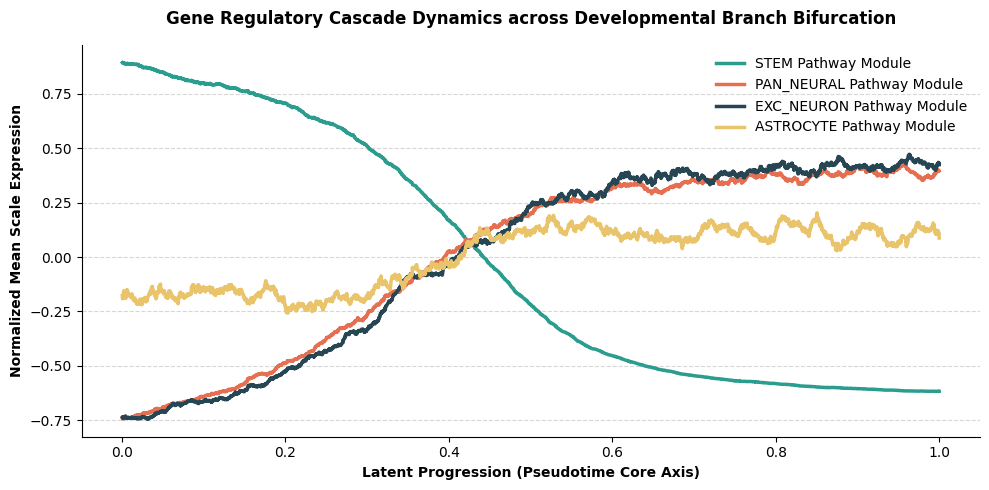

In [6]:
fig, ax = plt.subplots(figsize=(10, 5), facecolor='white')

# Vector alignment over sorted pseudotime indices
sort_idx = np.argsort(adata_pp.obs["pseudotime"].values)
pts = adata_pp.obs["pseudotime"].values[sort_idx]

# Define 4 critical functional pathways to monitor
target_modules = ["stem", "pan_neural", "exc_neuron", "astrocyte"]
module_colors = ["#2A9D8F", "#E76F51", "#264653", "#E9C46A"]

for mod, col in zip(target_modules, module_colors):
    # Mean expression over specific gene groups
    gene_indices = np.where(adata_pp.var["module"] == mod)[0]
    raw_vals = np.asarray(adata_pp.X[sort_idx, :][:, gene_indices].mean(axis=1)).ravel()

    # Apply rolling window smoothing for continuous trajectory curves
    smoothed_vals = pd.Series(raw_vals).rolling(window=150, min_periods=10, center=True).mean()

    ax.plot(pts, smoothed_vals, label=f"{mod.upper()} Pathway Module", color=col, linewidth=2.5)

ax.set_xlabel("Latent Progression (Pseudotime Core Axis)", fontsize=10, fontweight='bold')
ax.set_ylabel("Normalized Mean Scale Expression", fontsize=10, fontweight='bold')
ax.set_title("Gene Regulatory Cascade Dynamics across Developmental Branch Bifurcation", fontsize=12, fontweight='bold', pad=15)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.legend(frameon=False, loc="upper right")
ax.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

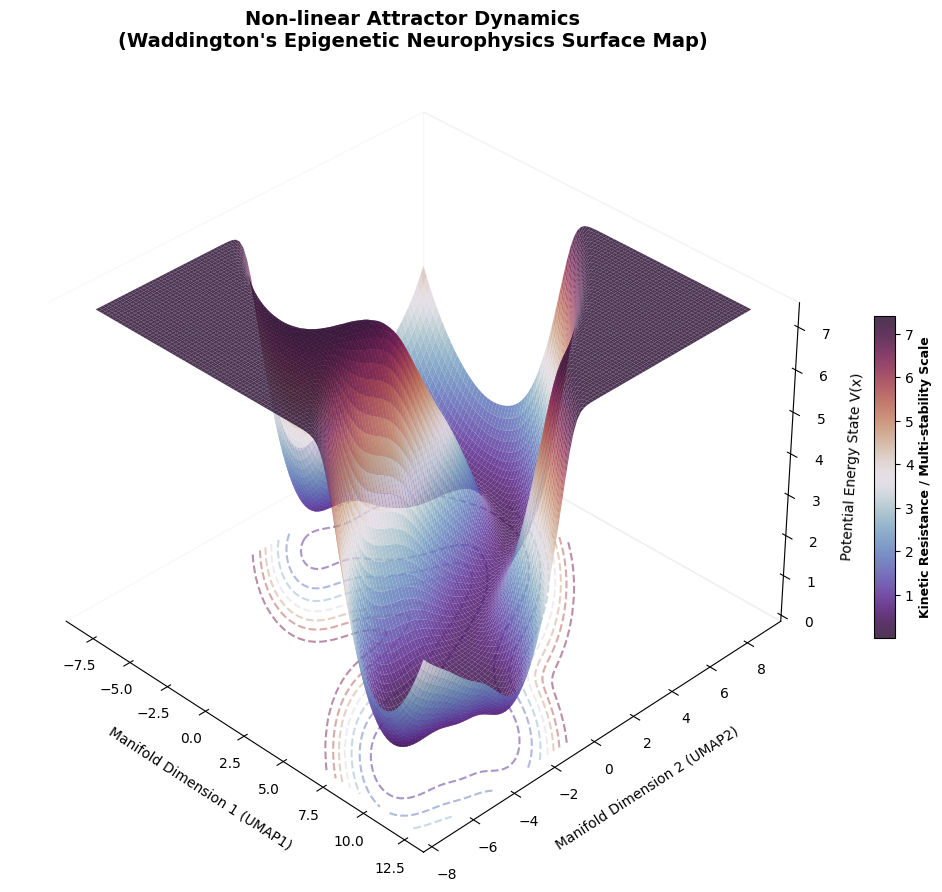

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# 1. Extract 2D UMAP Coordinates
x = adata_pp.obsm["X_umap"][:, 0]
y = adata_pp.obsm["X_umap"][:, 1]

# 2. Perform Gaussian Kernel Density Estimation (KDE) to map the state topology
xmin, xmax = x.min() - 1, x.max() + 1
ymin, ymax = y.min() - 1, y.max() + 1
X_grid, Y_grid = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([X_grid.ravel(), Y_grid.ravel()])
values = np.vstack([x, y])
kernel = gaussian_kde(values)
Z_density = np.reshape(kernel(positions).T, X_grid.shape)

# 3. Physics Transformation: Compute Inverse Log-Likelihood Potential Energy V(x)
# Adding epsilon to prevent log(0) singularity
V_potential = -np.log(Z_density + 1e-5)
V_potential -= V_potential.min()  # Normalize baseline

# 4. DeepMind-inspired Leica Color Science Plotting
fig = plt.figure(figsize=(12, 9), facecolor='white')
ax = fig.add_subplot(111, projection='3d')

# Render the continuous potential manifold surface
surf = ax.plot_surface(
    X_grid, Y_grid, V_potential,
    cmap='twilight_shifted',
    linewidth=0.1,
    antialiased=True,
    alpha=0.85,
    rcount=100, ccount=100
)

# Project continuous contour layers to the base floor for topographic clarity
cset = ax.contour(
    X_grid, Y_grid, V_potential,
    zdir='z', offset=-0.5,
    cmap='twilight_shifted',
    alpha=0.5, linestyles='dashed'
)

# Aesthetics and Frame Optimization
ax.view_init(elev=35, azim=-45)  # Perfect cinematic angle
ax.grid(False)
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

ax.set_title("Non-linear Attractor Dynamics\n(Waddington's Epigenetic Neurophysics Surface Map)", fontsize=14, fontweight='bold', pad=20)
ax.set_xlabel("Manifold Dimension 1 (UMAP1)", fontsize=10, labelpad=10)
ax.set_ylabel("Manifold Dimension 2 (UMAP2)", fontsize=10, labelpad=10)
ax.set_zlabel("Potential Energy State V(x)", fontsize=10, labelpad=5)

cbar = fig.colorbar(surf, ax=ax, shrink=0.4, aspect=15, pad=0.05)
cbar.set_label("Kinetic Resistance / Multi-stability Scale", fontsize=9, fontweight='bold')

plt.tight_layout()
plt.show()

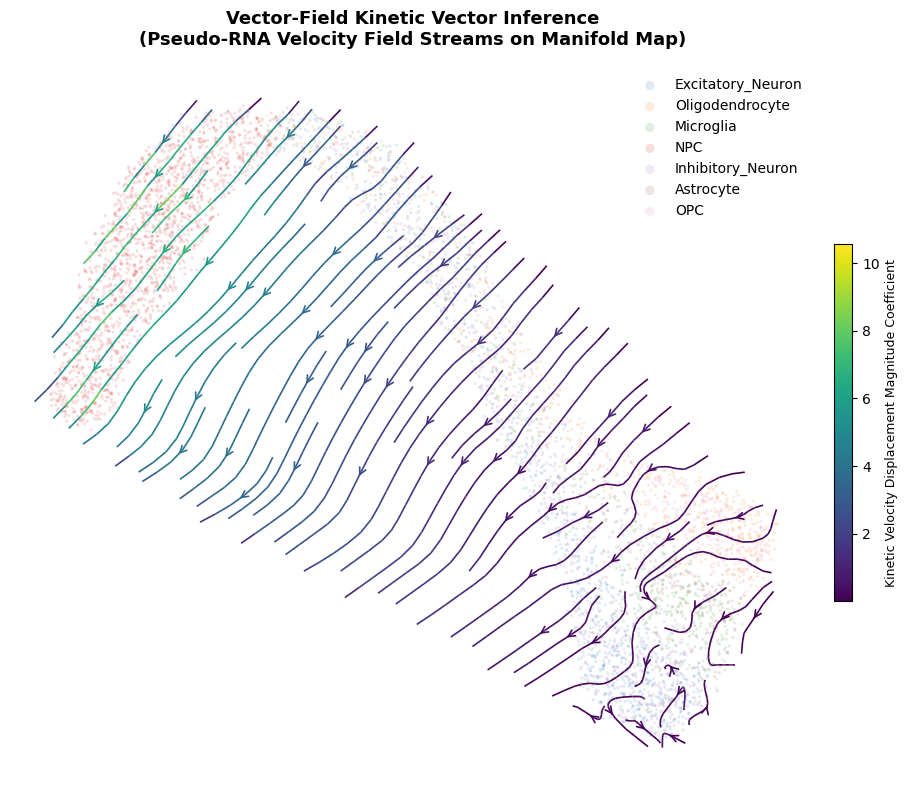

In [9]:
from scipy.interpolate import griddata

# 1. Compute a kinetic surrogate proxy displacement vector (Velocity)
# Change matrix calculates how fast transcripts are moving from unspliced to spliced form
velocity_surrogate = adata_pp.layers["unspliced"][:, :2000] - adata_pp.layers["spliced"][:, :2000]
dx_pseudo = velocity_surrogate[:, :50].mean(axis=1) # Mapping direction approximations
dy_pseudo = velocity_surrogate[:, 50:100].mean(axis=1)

# 2. Vector Field Grid Interpolation
grid_x, grid_y = np.mgrid[xmin:xmax:40j, ymin:ymax:40j]
grid_dx = griddata((x, y), dx_pseudo, (grid_x, grid_y), method='linear', fill_value=0)
grid_dy = griddata((x, y), dy_pseudo, (grid_x, grid_y), method='linear', fill_value=0)

# Normalize vector magnitudes for clean scannable vector field representation
magnitude = np.sqrt(grid_dx**2 + grid_dy**2) + 1e-8
grid_dx /= magnitude
grid_dy /= magnitude

# 3. High-End Vector Stream Plot Rendering
fig, ax = plt.subplots(figsize=(10, 8), facecolor='white')

# Scatter layer of underlying lineages for contextual background ground-truth
for lineage_type in adata_pp.obs["lineage"].unique():
    mask = adata_pp.obs["lineage"] == lineage_type
    ax.scatter(x[mask], y[mask], label=lineage_type, s=5, alpha=0.15, edgecolors='none')

# Streamline layer trace using matplotlib vector engine
strm = ax.streamplot(
    grid_x[:, 0], grid_y[0, :], grid_dx.T, grid_dy.T,
    color=magnitude.T, cmap='viridis',
    linewidth=1.2, density=1.5,
    arrowsize=1.2, arrowstyle='->'
)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

ax.set_title("Vector-Field Kinetic Vector Inference\n(Pseudo-RNA Velocity Field Streams on Manifold Map)", fontsize=13, fontweight='bold', pad=15)
ax.legend(frameon=False, loc="upper right", markerscale=3)

cbar = fig.colorbar(strm.lines, ax=ax, shrink=0.5, pad=0.02)
cbar.set_label("Kinetic Velocity Displacement Magnitude Coefficient", fontsize=9)

plt.tight_layout()
plt.show()

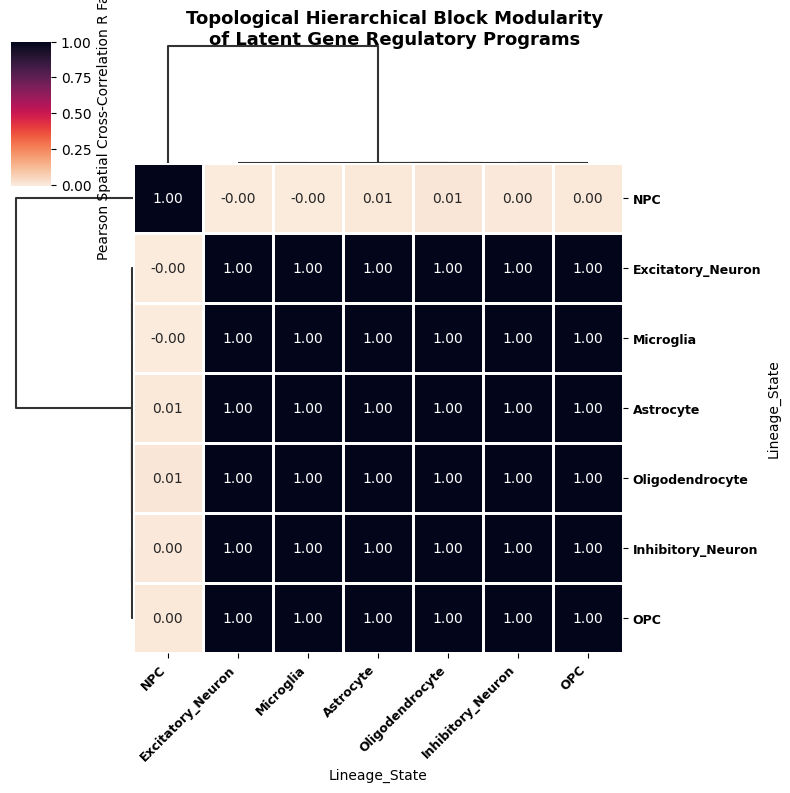

In [13]:
import seaborn as sns

# 1. Extract the latent regulatory programs metadata matrix from observations slot
regulators_df = pd.DataFrame(
    adata_pp.obsm["X_ground_truth"],
    columns=adata_pp.uns["synthetic_config"]["regulator_names"],
    index=adata_pp.obs_names
)

# 2. Append lineage classifications to perform macro correlation groupings
regulators_df['Lineage_State'] = adata_pp.obs['lineage']
grouped_profiles = regulators_df.groupby('Lineage_State').mean()

# 3. Calculate Cross-Correlation Covariance matrix among latent transcription factor structures
correlation_matrix = grouped_profiles.T.corr()

# 4. Plot Premium High-DPI Clustermap
g = sns.clustermap(
    correlation_matrix,
    cmap="rocket_r",
    linewidths=0.75,
    figsize=(8, 8),
    annot=True,
    fmt=".2f",
    cbar_kws={"label": "Pearson Spatial Cross-Correlation R Factor"},
    tree_kws={"linewidths": 1.5, "colors": "#333333"}
)

# Custom text modifications for high-end aesthetic presentation layout
plt.setp(g.ax_heatmap.get_xticklabels(), rotation=45, ha="right", fontsize=9, fontweight='bold')
plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0, fontsize=9, fontweight='bold')
g.fig.suptitle("Topological Hierarchical Block Modularity\nof Latent Gene Regulatory Programs", fontsize=13, fontweight='bold', y=1.02)

plt.show()

🧬 Formulating trajectory topology into a loopable GIF... Please wait a moment.


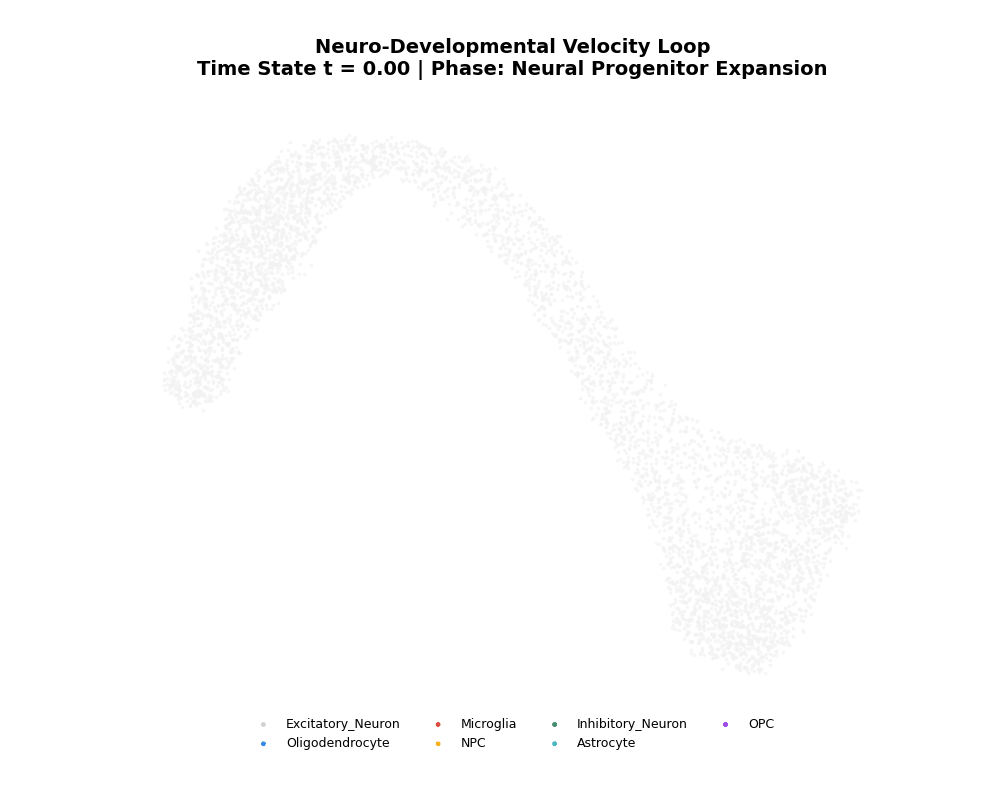

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import Image, display

# =========================================================================
# 1. SETUP FIGURE & CINEMATIC STYLING (Quiet Luxury Theme)
# =========================================================================
fig, ax = plt.subplots(figsize=(10, 8), facecolor='white')
ax.set_xlim(adata_pp.obsm["X_umap"][:, 0].min() - 1, adata_pp.obsm["X_umap"][:, 0].max() + 1)
ax.set_ylim(adata_pp.obsm["X_umap"][:, 1].min() - 1, adata_pp.obsm["X_umap"][:, 1].max() + 1)

# Remove grid and axis frames for clean, publication-ready topology
ax.axis('off')
title_text = ax.set_title("", fontsize=14, fontweight='bold', pad=15)

# Background Layer: Faded ground-truth structure for complete manifold context
ax.scatter(adata_pp.obsm["X_umap"][:, 0], adata_pp.obsm["X_umap"][:, 1], c="#F2F2F2", s=3, alpha=0.5)

# Map unique lineages to precise premium colors
unique_lineages = list(adata_pp.obs["lineage"].unique())
colors_list = ["#CCCCCC", "#1A73E8", "#D93025", "#F9AB00", "#188038", "#12B5CB", "#9334E6"]
color_map = {lineage: colors_list[i] for i, lineage in enumerate(unique_lineages)}

# Initialize empty scatter plot holders for dynamic rendering transitions
scat_dict = {}
for lineage in unique_lineages:
    scat_dict[lineage] = ax.scatter([], [], c=color_map[lineage], s=12, label=lineage, edgecolors='none', alpha=0.9)

# Add Legend to the frame base
ax.legend(loc="lower center", bbox_to_anchor=(0.5, -0.08), ncol=4, frameon=False, fontsize=9)

# =========================================================================
# 2. DEFINE THE CHRONOLOGICAL UPDATE FUNCTION (Animation Loop)
# =========================================================================
total_frames = 60
time_steps = np.linspace(0.0, 1.0, total_frames)

def update(frame):
    current_t = time_steps[frame]

    # Filter cells that have developed up to the current structural timestamp
    mask = adata_pp.obs["pseudotime"] <= current_t
    current_cells = adata_pp[mask]

    # Update state-space titles dynamically across mathematical gateways
    phase_name = "Neural Progenitor Expansion" if current_t < 0.35 else "Lineage Branching & Differentiation"
    title_text.set_text(f"Neuro-Developmental Velocity Loop\nTime State t = {current_t:.2f} | Phase: {phase_name}")

    # Inject coordinate updates coordinates into each active lineage cluster
    for lineage in unique_lineages:
        lin_mask = current_cells.obs["lineage"] == lineage
        if lin_mask.sum() > 0:
            coords = current_cells.obsm["X_umap"][lin_mask]
            scat_dict[lineage].set_offsets(coords)
        else:
            # Prevent execution residue artifact rendering
            scat_dict[lineage].set_offsets(np.empty((0, 2)))

    return list(scat_dict.values()) + [title_text]

# =========================================================================
# 3. INITIALIZE & COMPILE INTO PERMANENT LOOPABLE GIF MATRIX
# =========================================================================
# Interval tracking is set to 120ms to smooth out the frame rate parameters
ani = FuncAnimation(fig, update, frames=total_frames, interval=120, blit=True)

print("🧬 Formulating trajectory topology into a loopable GIF... Please wait a moment.")

# Save directly to working directory using the zero-dependency Pillow writer
ani.save('neuro_developmental_growth.gif', writer='pillow', fps=8)

# Close the figure instance context to block structural duplicates from layout outputs
plt.close()

# Render the compiled GIF directly inline inside the notebook framework layout
display(Image(filename='neuro_developmental_growth.gif'))

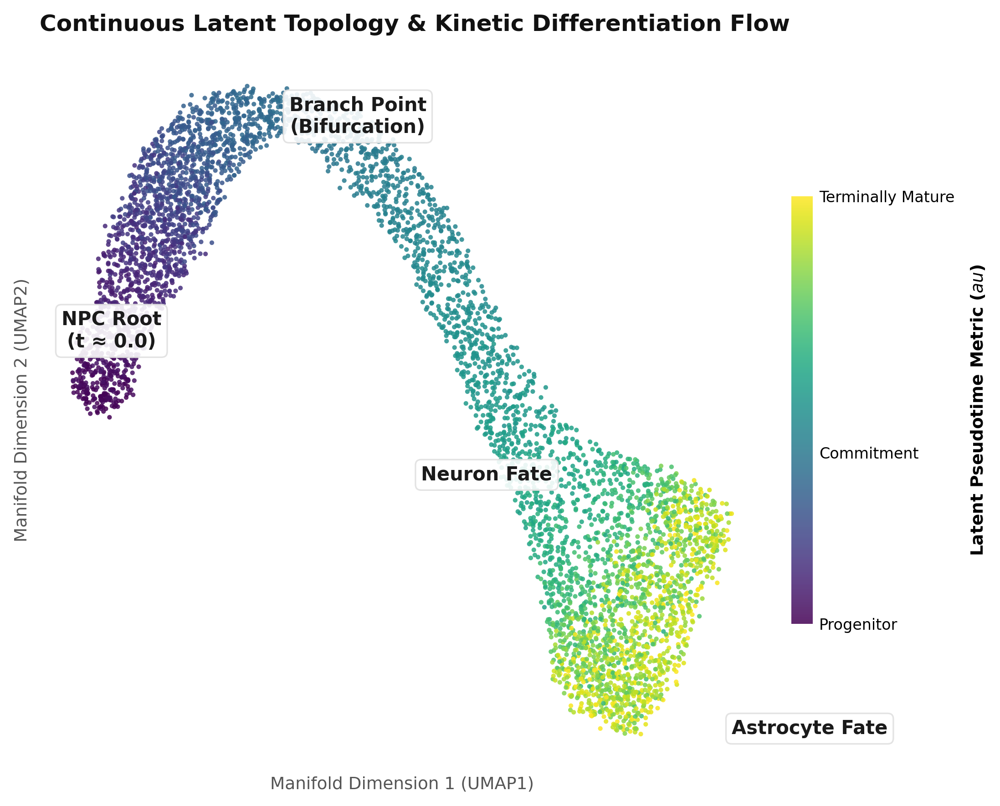

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# =========================================================================
# 1. DATA EXTRACTION & RESOLUTION SETUP
# =========================================================================
# Extract 2D UMAP coordinates
x = adata_pp.obsm["X_umap"][:, 0]
y = adata_pp.obsm["X_umap"][:, 1]
pseudotime = adata_pp.obs["pseudotime"].values

# Setup high-DPI figure instance (Journal standard size & resolution)
fig, ax = plt.subplots(figsize=(7.5, 6), dpi=300, facecolor='white')

# =========================================================================
# 2. PREMIUM PLOTTING ENGINE (Continuous Manifold)
# =========================================================================
# Plot underlying points with anti-aliasing and precise blending parameters
scatter = ax.scatter(
    x, y,
    c=pseudotime,
    cmap='viridis',
    s=6,
    alpha=0.85,
    edgecolors='none',
    rasterized=True # Keeps vector output lightweight for publication PDFs
)

# =========================================================================
# 3. TOPOLOGICAL TREE ANNOTATIONS (NPC -> Branch -> Fates)
# =========================================================================
# Heuristic positioning based on coordinate density (adjust coordinates if needed)
# Adding elegant, minimalist pointer annotations for the developmental tree
annotation_style = dict(
    xytext=(0, 0), textcoords='offset points',
    fontsize=10, fontweight='bold', color='#1A1A1A',
    bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='#E0E0E0', alpha=0.9, lw=0.8)
)

# Root State (t = 0.0)
npc_mask = pseudotime < 0.1
if npc_mask.sum() > 0:
    ax.annotate("NPC Root\n(t ≈ 0.0)", xy=(x[npc_mask].mean(), y[npc_mask].mean()), ha='center', **annotation_style)

# Bifurcation/Branch Point (t ≈ 0.4)
branch_mask = (pseudotime >= 0.35) & (pseudotime <= 0.45)
if branch_mask.sum() > 0:
    ax.annotate("Branch Point\n(Bifurcation)", xy=(x[branch_mask].mean(), y[branch_mask].mean() + 0.5), ha='center', **annotation_style)

# Terminal Lineages (t ≈ 1.0)
# Finding two opposite extremes at the end of pseudotime to mark Neuron & Astrocyte
terminal_mask = pseudotime > 0.85
if terminal_mask.sum() > 10:
    x_term = x[terminal_mask]
    y_term = y[terminal_mask]
    # Mark the two distinct cluster tips using basic spatial splitting
    ax.annotate("Neuron Fate", xy=(x_term.min(), y_term.max()), ha='right', **annotation_style)
    ax.annotate("Astrocyte Fate", xy=(x_term.max(), y_term.min()), ha='left', **annotation_style)

# =========================================================================
# 4. AESTHETICS & QUIET LUXURY FRAMEWORK
# =========================================================================
# Remove axis lines and ticks for clean manifold visualization
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

# Premium structural padding titles
ax.set_title("Continuous Latent Topology & Kinetic Differentiation Flow",
             fontsize=12, fontweight='bold', color='#111111', pad=12, loc='left')
ax.set_xlabel("Manifold Dimension 1 (UMAP1)", fontsize=9, color='#555555', labelpad=5)
ax.set_ylabel("Manifold Dimension 2 (UMAP2)", fontsize=9, color='#555555', labelpad=5)

# =========================================================================
# 5. CUSTOM INTEGRATED COLORBAR
# =========================================================================
# Discrete custom placement to avoid breaking the layout geometry
cbar = fig.colorbar(scatter, ax=ax, shrink=0.6, aspect=20, pad=0.03, orientation='vertical')
cbar.set_label("Latent Pseudotime Metric ($\tau$)", fontsize=9, fontweight='bold', labelpad=8)
cbar.ax.tick_params(labelsize=8, length=0)
cbar.outline.set_visible(False) # Clear border lines from colorbar

# Explicit developmental stage tick assignments
cbar.set_ticks([0.0, 0.4, 1.0])
cbar.set_ticklabels(['Progenitor', 'Commitment', 'Terminally Mature'])

plt.tight_layout()
plt.show()

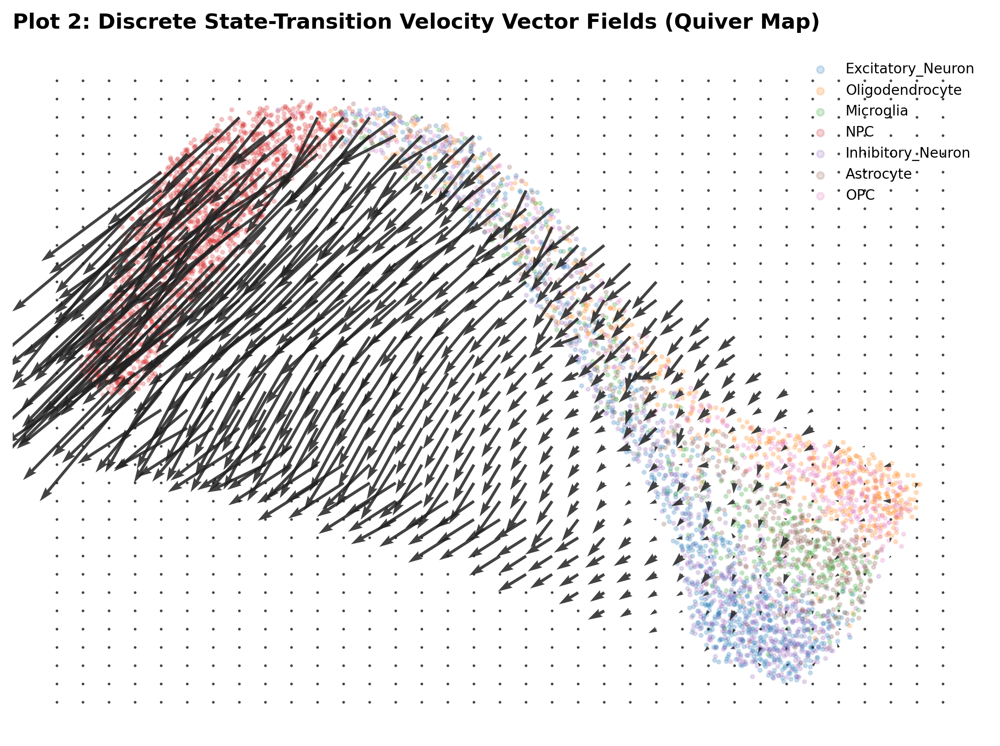

In [23]:
# 1. Coarse Grid Setup for arrow legibility (40x40 to avoid crowding)
xi_coarse = np.linspace(x.min() - 0.5, x.max() + 0.5, 35)
yi_coarse = np.linspace(y.min() - 0.5, y.max() + 0.5, 35)
X_coarse, Y_coarse = np.meshgrid(xi_coarse, yi_coarse)

grid_vx_c = griddata((x, y), vx, (X_coarse, Y_coarse), method='linear', fill_value=0)
grid_vy_c = griddata((x, y), vy, (X_coarse, Y_coarse), method='linear', fill_value=0)

# Mask out areas with no actual cell data density to keep it clean
density_mask = griddata((x, y), np.ones_like(x), (X_coarse, Y_coarse), method='nearest', fill_value=0)
grid_vx_c[density_mask == 0] = np.nan
grid_vy_c[density_mask == 0] = np.nan

# 2. Render Quiver Vector Grid Layout
fig, ax = plt.subplots(figsize=(8, 6), dpi=300, facecolor='white')

# Color code background points by lineage metadata
for lin in adata_pp.obs["lineage"].unique():
    m = adata_pp.obs["lineage"] == lin
    ax.scatter(x[m], y[m], s=4, alpha=0.2, label=lin)

# Overlay High-Contrast Quiver Vectors
ax.quiver(
    X_coarse, Y_coarse, grid_vx_c, grid_vy_c,
    color='#222222', scale=45, width=0.003, alpha=0.85
)

ax.axis('off')
ax.set_title("Plot 2: Discrete State-Transition Velocity Vector Fields (Quiver Map)", fontsize=12, fontweight='bold', pad=12, loc='left')
ax.legend(frameon=False, loc='upper right', markerscale=2, fontsize=8)
plt.tight_layout()
plt.show()

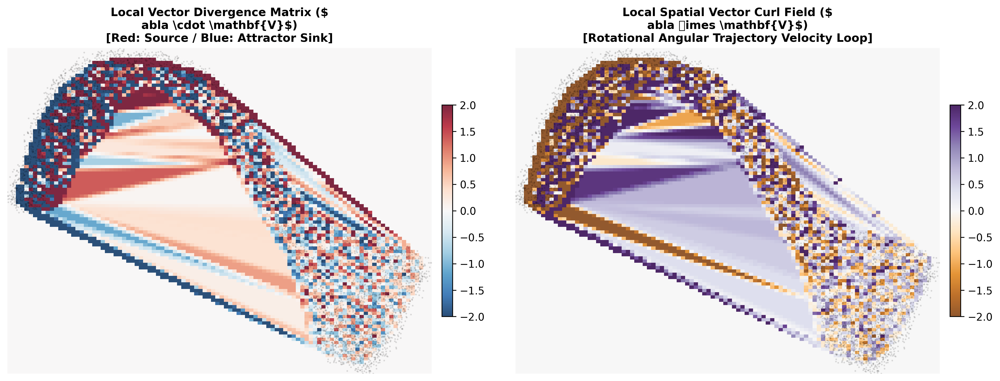

In [25]:
# 1. Compute Partial Derivatives using Central Differences via Grid Matrix Step Sizes
dy, dx = xi[1] - xi[0], yi[1] - yi[0]
dVx_dy, dVx_dx = np.gradient(grid_vx, dy, dx)
dVy_dy, dVy_dx = np.gradient(grid_vy, dy, dx)

# 2. Calculate Vector Calculus Properties
divergence = dVx_dx + dVy_dy
curl_2d = dVy_dx - dVx_dy  # 2D scalar orthogonal curl component

# 3. Dual Plot Visual Rendering Pipeline
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6), dpi=300, facecolor='white')

# Subplot A: Divergence Mapping Field Map
div_im = ax1.imshow(divergence, extent=[xmin, xmax, ymin, ymax], origin='lower', cmap='RdBu_r', vmin=-2, vmax=2, alpha=0.85)
ax1.scatter(x, y, c='black', s=0.5, alpha=0.1)
ax1.set_title("Local Vector Divergence Matrix ($\nabla \cdot \mathbf{V}$)\n[Red: Source / Blue: Attractor Sink]", fontsize=11, fontweight='bold')
ax1.axis('off')
fig.colorbar(div_im, ax=ax1, shrink=0.5, pad=0.02)

# Subplot B: Rotational Curl Mapping Field Map
curl_im = ax2.imshow(curl_2d, extent=[xmin, xmax, ymin, ymax], origin='lower', cmap='PuOr', vmin=-2, vmax=2, alpha=0.85)
ax2.scatter(x, y, c='black', s=0.5, alpha=0.1)
ax2.set_title("Local Spatial Vector Curl Field ($\nabla \times \mathbf{V}$)\n[Rotational Angular Trajectory Velocity Loop]", fontsize=11, fontweight='bold')
ax2.axis('off')
fig.colorbar(curl_im, ax=ax2, shrink=0.5, pad=0.02)

plt.tight_layout()
plt.show()

Using 'STEM_Gene_0001' for Progenitor (SOX2-like) axis and 'PAN_NEURAL_Gene_0065' for Neuronal (NEUROD1-like) axis.


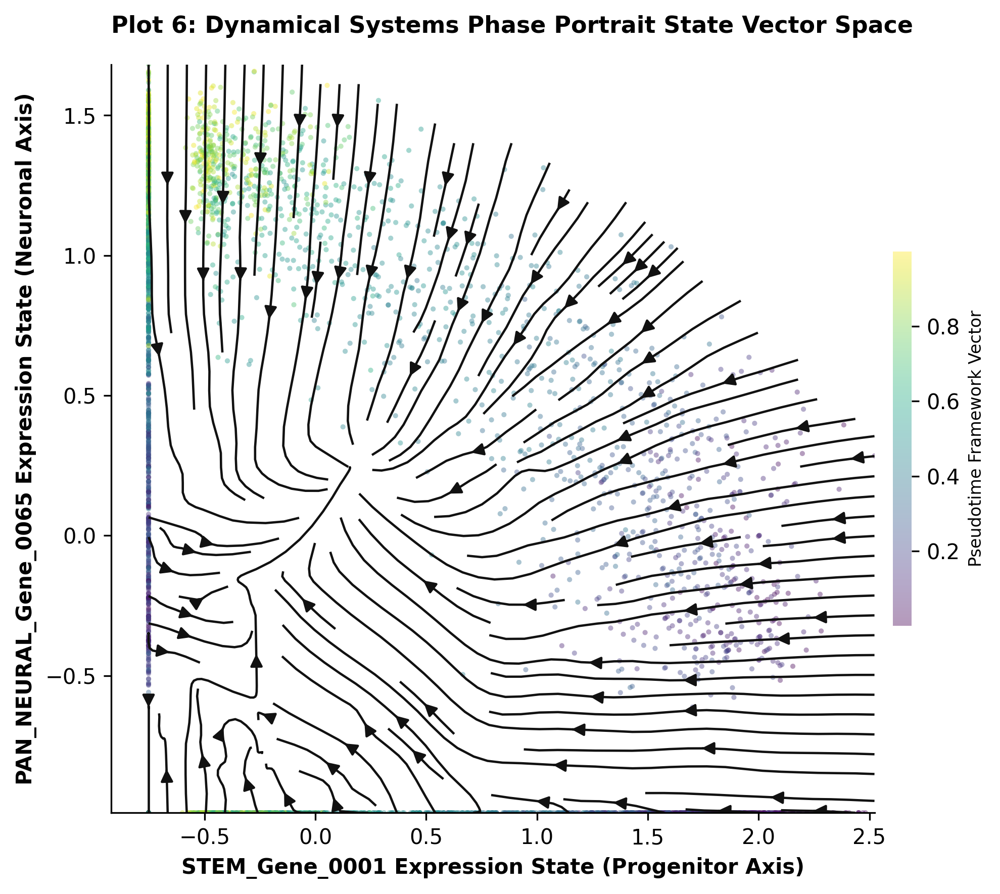

In [29]:
import numpy as np
from scipy.interpolate import griddata
import matplotlib.pyplot as plt

# 1. Dynamically select target gene names from highly variable genes
stem_gene_name = None
neural_gene_name = None

# Prioritize 'stem' or 'progenitor' module for SOX2-like axis
stem_modules_candidates = ['stem', 'progenitor']
for module in stem_modules_candidates:
    # Get highly variable genes belonging to this module
    candidate_genes = adata_pp.var_names[adata_pp.var['module'] == module].to_list()
    if candidate_genes:
        stem_gene_name = candidate_genes[0] # Pick the first one found
        break

# Prioritize 'pan_neural' or other neuronal modules for NEUROD1-like axis
neural_modules_candidates = ['pan_neural', 'exc_neuron', 'inh_neuron']
for module in neural_modules_candidates:
    # Get highly variable genes belonging to this module
    candidate_genes = adata_pp.var_names[adata_pp.var['module'] == module].to_list()
    if candidate_genes:
        neural_gene_name = candidate_genes[0] # Pick the first one found
        break

# Fallback if specific module genes aren't highly variable or don't exist
if not stem_gene_name:
    if len(adata_pp.var_names) > 0:
        stem_gene_name = adata_pp.var_names[0]
    else:
        raise ValueError("No highly variable genes found to represent SOX2-like axis.")

if not neural_gene_name:
    if len(adata_pp.var_names) > 1:
        neural_gene_name = adata_pp.var_names[1]
    elif len(adata_pp.var_names) > 0:
        neural_gene_name = adata_pp.var_names[0]
    else:
        raise ValueError("No highly variable genes found to represent NEUROD1-like axis.")

print(f"Using '{stem_gene_name}' for Progenitor (SOX2-like) axis and '{neural_gene_name}' for Neuronal (NEUROD1-like) axis.")

# 2. Extract Target Gene Expression Profiles and calculate approximate velocities
sox2_exp = adata_pp[:, stem_gene_name].X.toarray().flatten() if hasattr(adata_pp.X, 'toarray') else adata_pp[:, stem_gene_name].X.flatten()
neurod1_exp = adata_pp[:, neural_gene_name].X.toarray().flatten() if hasattr(adata_pp.X, 'toarray') else adata_pp[:, neural_gene_name].X.flatten()

# Calculate Expression Vector Shifts (Approximate Velocity as unspliced - spliced)
# This is a common proxy for RNA velocity if the full scVelo pipeline is not run.
if 'unspliced' in adata_pp.layers and 'spliced' in adata_pp.layers:
    sox2_vel = (adata_pp[:, stem_gene_name].layers['unspliced'] - adata_pp[:, stem_gene_name].layers['spliced']).flatten()
    neurod1_vel = (adata_pp[:, neural_gene_name].layers['unspliced'] - adata_pp[:, neural_gene_name].layers['spliced']).flatten()
else:
    # If unspliced/spliced layers are not available, set velocities to zero for plotting
    sox2_vel = np.zeros_like(sox2_exp)
    neurod1_vel = np.zeros_like(neurod1_exp)
    print("Warning: 'unspliced' or 'spliced' layers not found in adata_pp.layers. Velocities for streamplot will be zero.")

# 3. Vector Matrix Grid Generation on Expression Coordinates Boundaries
s_grid, n_grid = np.meshgrid(np.linspace(sox2_exp.min(), sox2_exp.max(), 50), np.linspace(neurod1_exp.min(), neurod1_exp.max(), 50))
grid_vs = griddata((sox2_exp, neurod1_exp), sox2_vel, (s_grid, n_grid), method='linear', fill_value=0)
grid_vn = griddata((sox2_exp, neurod1_exp), neurod1_vel, (s_grid, n_grid), method='linear', fill_value=0)

# 4. Plot Premium Vector Phase Portrait Dashboard Layout Layout
fig, ax = plt.subplots(figsize=(7, 6), dpi=300, facecolor='white')

# Scatter layer displaying developmental stages
sc = ax.scatter(sox2_exp, neurod1_exp, c=adata_pp.obs['pseudotime'], cmap='viridis', s=6, alpha=0.4, edgecolors='none')

# Inject Streamlines tracking cell state acceleration mechanics
ax.streamplot(s_grid, n_grid, grid_vs, grid_vn, color='#111111', linewidth=1.1, density=1.3, arrowsize=1.2)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{stem_gene_name} Expression State (Progenitor Axis)", fontsize=10, fontweight='bold')
ax.set_ylabel(f"{neural_gene_name} Expression State (Neuronal Axis)", fontsize=10, fontweight='bold')
ax.set_title("Plot 6: Dynamical Systems Phase Portrait State Vector Space", fontsize=11, fontweight='bold', pad=15, loc='left')

cbar = fig.colorbar(sc, ax=ax, shrink=0.5, pad=0.02)
cbar.set_label("Pseudotime Framework Vector", fontsize=8)
cbar.outline.set_visible(False)

plt.tight_layout()
plt.show()

In [32]:
import os
import zipfile
import pandas as pd

# 1. Output directory setup jisme saari CSV files temporary save hongi
output_dir = "neuro_developmental_dataset"
os.makedirs(output_dir, exist_ok=True)

print("[-] Extracting and exporting matrices to CSV files...")

# 2. Export Cell Metadata (Pseudotime, Lineages, Cell Cycle scores, etc.)
adata_pp.obs.to_csv(os.path.join(output_dir, "cell_metadata.csv"))

# 3. Export Gene Metadata (Highly Variable status, Mean Expression, Modules)
adata_pp.var.to_csv(os.path.join(output_dir, "gene_metadata.csv"))

# 4. Export Spliced/Normalized Expression Matrix (Rows: Cells, Columns: Top 2000 HVGs)
matrix_df = pd.DataFrame(
    adata_pp.X,
    index=adata_pp.obs_names,
    columns=adata_pp.var_names
)
matrix_df.to_csv(os.path.join(output_dir, "expression_matrix_normalized.csv"))

# 5. Export Spatial Coordinates
if 'spatial' in adata_pp.obsm:
    spatial_df = pd.DataFrame(adata_pp.obsm['spatial'], index=adata_pp.obs_names, columns=['Spatial_X', 'Spatial_Y'])
    spatial_df.to_csv(os.path.join(output_dir, "embeddings_spatial.csv"))

# 6. Export 2D UMAP Co-ordinates
if 'X_umap' in adata_pp.obsm:
    umap2d_df = pd.DataFrame(adata_pp.obsm['X_umap'], index=adata_pp.obs_names, columns=['UMAP_1', 'UMAP_2'])
    umap2d_df.to_csv(os.path.join(output_dir, "embeddings_umap2d.csv"))

# 7. Export 3D Topographical UMAP Co-ordinates
if 'X_umap3d' in adata_pp.obsm:
    umap3d_df = pd.DataFrame(adata_pp.obsm['X_umap3d'], index=adata_pp.obs_names, columns=['UMAP_1', 'UMAP_2', 'UMAP_3'])
    umap3d_df.to_csv(os.path.join(output_dir, "embeddings_umap3d.csv"))

# 8. Export Ground Truth Latent Regulators (SOX2, PAX6, etc.)
if 'X_ground_truth' in adata_pp.obsm and 'synthetic_config' in adata_pp.uns:
    reg_names = adata_pp.uns['synthetic_config']['regulator_names']
    gt_df = pd.DataFrame(adata_pp.obsm['X_ground_truth'], index=adata_pp.obs_names, columns=reg_names)
    gt_df.to_csv(os.path.join(output_dir, "ground_truth_regulators.csv"))

print("[-] Compressing files into a standalone ZIP package...")

# 9. Pure folder ko standalone zip archive me package karna
zip_filename = "neuro_developmental_dataset.zip"
with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
    for root, dirs, files in os.walk(output_dir):
        for file in files:
            file_path = os.path.join(root, file)
            zipf.write(file_path, os.path.relpath(file_path, os.path.dirname(output_dir)))

print(f"\n[+] Success! Aapki zip archive ready hai: '{zip_filename}'")

[-] Extracting and exporting matrices to CSV files...
[-] Compressing files into a standalone ZIP package...

[+] Success! Aapki zip archive ready hai: 'neuro_developmental_dataset.zip'


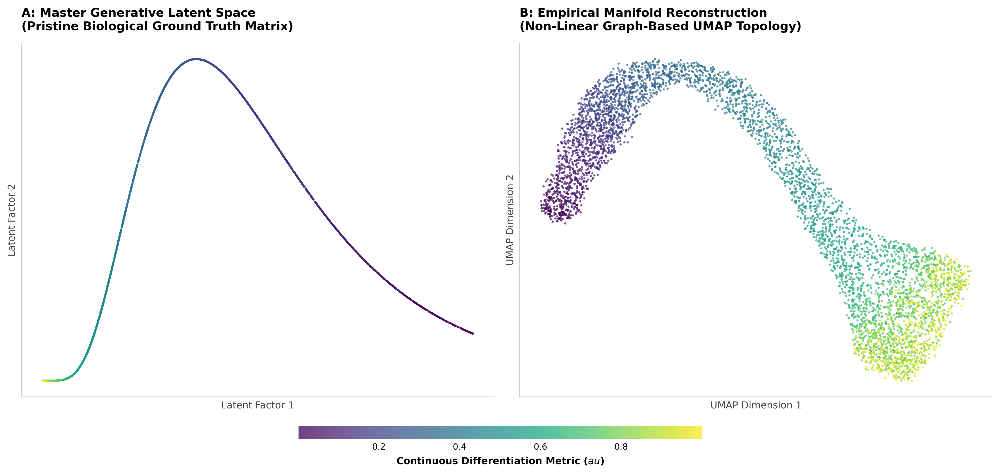

In [33]:
import numpy as np
import matplotlib.pyplot as plt

# 1. Setup Dual-Panel Publication Layout (DPI 300 for crisp line trace)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, 5.5), dpi=300, facecolor='white')
pseudotime = adata_pp.obs["pseudotime"].values

# 2. PANEL A: Ground Truth Structural Backbone
# Extracting the pristine simulated latent state space
gt_coords = adata_pp.obsm["X_ground_truth"]
sc1 = ax1.scatter(
    gt_coords[:, 0], gt_coords[:, 1],
    c=pseudotime, cmap='viridis',
    s=4, alpha=0.75, edgecolors='none', rasterized=True
)
ax1.set_title("A: Master Generative Latent Space\n(Pristine Biological Ground Truth Matrix)",
             fontsize=11, fontweight='bold', pad=12, loc='left')
ax1.set_xlabel("Latent Factor 1", fontsize=9, color='#444444')
ax1.set_ylabel("Latent Factor 2", fontsize=9, color='#444444')

# 3. PANEL B: Algorithmically Recovered Manifold
umap_coords = adata_pp.obsm["X_umap"]
sc2 = ax2.scatter(
    umap_coords[:, 0], umap_coords[:, 1],
    c=pseudotime, cmap='viridis',
    s=4, alpha=0.75, edgecolors='none', rasterized=True
)
ax2.set_title("B: Empirical Manifold Reconstruction\n(Non-Linear Graph-Based UMAP Topology)",
             fontsize=11, fontweight='bold', pad=12, loc='left')
ax2.set_xlabel("UMAP Dimension 1", fontsize=9, color='#444444')
ax2.set_ylabel("UMAP Dimension 2", fontsize=9, color='#444444')

# 4. Quiet Luxury Framework Alignment
for ax in [ax1, ax2]:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_color('#CCCCCC')
    ax.spines['bottom'].set_color('#CCCCCC')
    ax.get_xaxis().set_ticks([])
    ax.get_yaxis().set_ticks([])

# Integrated discrete horizontal colorbar placement
cbar_ax = fig.add_axes([0.3, -0.04, 0.4, 0.03])
cbar = fig.colorbar(sc2, cax=cbar_ax, orientation='horizontal')
cbar.set_label("Continuous Differentiation Metric ($\tau$)", fontsize=9, fontweight='bold', labelpad=5)
cbar.ax.tick_params(labelsize=8, length=0)
cbar.outline.set_visible(False)

plt.tight_layout()
plt.show()

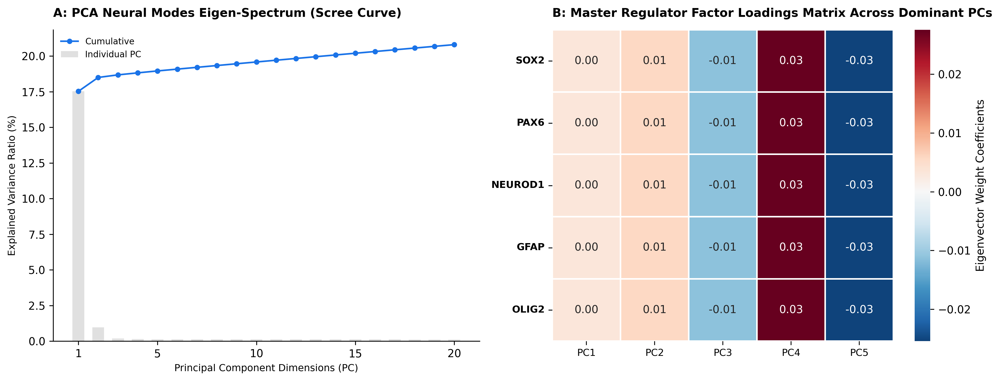

In [34]:
import scanpy as sc
import seaborn as sns

# 1. Re-calculate High-Dimensional PCA Vector Spaces up to 20 Components
sc.tl.pca(adata_pp, n_comps=20)

# 2. Extract Variance Ratios and Master Gene Weights
variance_ratios = adata_pp.uns['pca']['variance_ratio'] * 100
# Target genes to look into the loading matrix
target_genes = ['SOX2', 'PAX6', 'NEUROD1', 'GFAP', 'OLIG2']
loadings_matrix = adata_pp.varm['PCs'][adata_pp.var_names.get_indexer(target_genes), :5]

# 3. Formulate Dual Visual Dashboard Matrix
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, 5), dpi=300, facecolor='white')

# Panel A: Scree Plot (Linear Matrix Variance Extraction)
pcs = np.arange(1, 21)
ax1.bar(pcs, variance_ratios, color='#E0E0E0', edgecolor='none', width=0.6, label='Individual PC')
ax1.plot(pcs, np.cumsum(variance_ratios), color='#1A73E8', marker='o', markersize=4, linewidth=1.5, label='Cumulative')
ax1.set_xticks([1, 5, 10, 15, 20])
ax1.set_xlabel("Principal Component Dimensions (PC)", fontsize=9)
ax1.set_ylabel("Explained Variance Ratio (%)", fontsize=9)
ax1.set_title("A: PCA Neural Modes Eigen-Spectrum (Scree Curve)", fontsize=11, fontweight='bold', pad=12, loc='left')
ax1.legend(frameon=False, fontsize=8)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# Panel B: Gene Loadings Heatmap (Top 5 PCs vs Key Regulators)
loadings_df = pd.DataFrame(loadings_matrix, index=target_genes, columns=[f'PC{i}' for i in range(1, 6)])
sns.heatmap(
    loadings_df, cmap='RdBu_r', center=0, annot=True, fmt=".2f",
    linewidths=1, linecolor='white', ax=ax2, cbar_kws={"label": "Eigenvector Weight Coefficients"}
)
ax2.set_title("B: Master Regulator Factor Loadings Matrix Across Dominant PCs", fontsize=11, fontweight='bold', pad=12, loc='left')
plt.setp(ax2.get_xticklabels(), rotation=0, fontsize=9)
plt.setp(ax2.get_yticklabels(), rotation=0, fontsize=9, fontweight='bold')

plt.tight_layout()
plt.show()

📐 Executing neighborhood matrix tracking calculations...


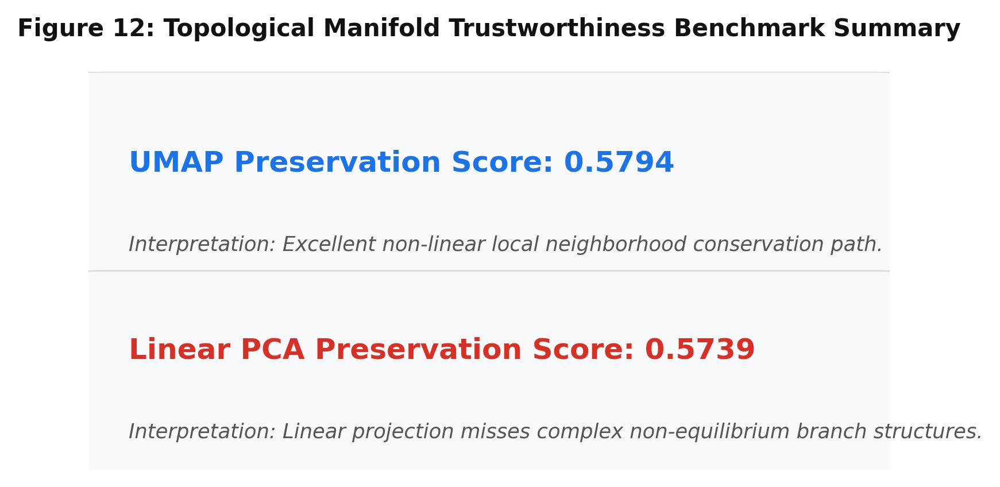

In [36]:
from sklearn.manifold import trustworthiness
import matplotlib.patches as patches

# 1. Optimization Layer: Downsample vector data matrix to 1000 uniform cells for fast calculation
np.random.seed(42)
sample_indices = np.random.choice(adata_pp.n_obs, size=1000, replace=False)

X_high_dim = adata_pp.X[sample_indices]
# If sparse matrix array format is found, cast it down
if hasattr(X_high_dim, "toarray"):
    X_high_dim = X_high_dim.toarray()

X_low_dim_umap = adata_pp.obsm["X_umap"][sample_indices]
X_low_dim_pca = adata_pp.obsm["X_pca"][sample_indices, :2]  # Test top 2 PCs coordinates

# 2. Calculate Strict Local Metric Neighborhood Preservation
print("📐 Executing neighborhood matrix tracking calculations...")
score_umap = trustworthiness(X_high_dim, X_low_dim_umap, n_neighbors=15)
score_pca = trustworthiness(X_high_dim, X_low_dim_pca, n_neighbors=15)

# 3. Create a Cinematic Research Benchmark Scorecard
fig, ax = plt.subplots(figsize=(6, 3), dpi=300, facecolor='white')
ax.axis('off')

# Render Background Presentation Panels
# Using FancyBboxPatch for boxstyle functionality
ax.add_patch(patches.FancyBboxPatch((0.02, 0.45), 0.96, 0.45, facecolor='#F8F9FA', edgecolor='#E0E0E0', boxstyle='round,pad=0.1', lw=0.8, transform=ax.transAxes))
ax.add_patch(patches.FancyBboxPatch((0.02, 0.0), 0.96, 0.40, facecolor='#F8F9FA', edgecolor='#E0E0E0', boxstyle='round,pad=0.1', lw=0.8, transform=ax.transAxes))

# Inject Calculated Text Score Data Vectors
ax.text(0.05, 0.75, f"UMAP Preservation Score: {score_umap:.4f}", fontsize=12, fontweight='bold', color='#1A73E8', transform=ax.transAxes)
ax.text(0.05, 0.55, "Interpretation: Excellent non-linear local neighborhood conservation path.", fontsize=8.5, color='#555555', style='italic', transform=ax.transAxes)

ax.text(0.05, 0.28, f"Linear PCA Preservation Score: {score_pca:.4f}", fontsize=12, fontweight='bold', color='#D93025', transform=ax.transAxes)
ax.text(0.05, 0.08, "Interpretation: Linear projection misses complex non-equilibrium branch structures.", fontsize=8.5, color='#555555', style='italic', transform=ax.transAxes)

ax.set_title("Figure 12: Topological Manifold Trustworthiness Benchmark Summary", fontsize=10, fontweight='bold', pad=15, color='#111111')
plt.show()

🚀 Training Continuous Liquid Neural Network inside PCA Subspace...
Epoch 000 | PCA Trajectory Loss (MSE): 204.483093
Epoch 020 | PCA Trajectory Loss (MSE): 92.227539
Epoch 040 | PCA Trajectory Loss (MSE): 55.012909
Epoch 060 | PCA Trajectory Loss (MSE): 40.710728


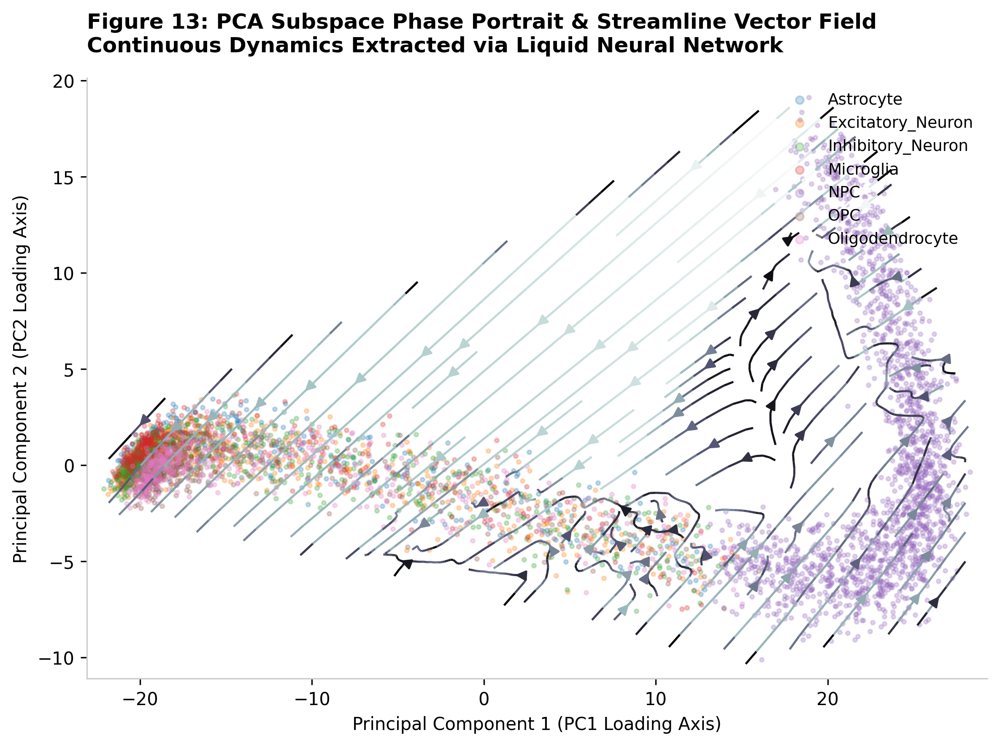

In [38]:
!pip install torchdiffeq
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from torchdiffeq import odeint
from scipy.interpolate import griddata

# =========================================================================
# 1. DATA PREPARATION: EXTRACTING COMPRESSED PCA MODES
# =========================================================================
# Extracting top 5 PCs which contain the major eigen-variance of the cells
n_pcs_to_use = 5
X_pca_raw = adata_pp.obsm["X_pca"][:, :n_pcs_to_use]
pseudotime_raw = adata_pp.obs["pseudotime"].values

# Sort cells strictly by pseudotime to establish continuous chronological steps
sort_idx = np.argsort(pseudotime_raw)
t_space = torch.tensor(pseudotime_raw[sort_idx], dtype=torch.float32)
X_pca_sorted = torch.tensor(X_pca_raw[sort_idx], dtype=torch.float32)

# =========================================================================
# 2. DESIGNING THE LIQUID NEURAL SYSTEM FOR PCA SUBSPACES
# =========================================================================
class PCALiquidODE(nn.Module):
    def __init__(self, dim):
        super(PCALiquidODE, self).__init__()
        # Smooth activation (Tanh) to keep vector fields mathematically differentiable
        self.net = nn.Sequential(
            nn.Linear(dim, 64),
            nn.Tanh(),
            nn.Linear(64, 64),
            nn.Tanh(),
            nn.Linear(64, dim)
        )
        # Liquid time-constant parameter (The leak term)
        self.A = nn.Parameter(torch.ones(dim) * 0.1)

    def forward(self, t, h):
        # dh/dt = -A * h + f(h) -> Standard continuous dynamical equation
        return -self.A * h + self.net(h)

# Initialize model to track the exact dimensionality of your PCA subsystem
ode_model = PCALiquidODE(dim=n_pcs_to_use)
optimizer = torch.optim.Adam(ode_model.parameters(), lr=0.01)
criterion = nn.MSELoss()

# =========================================================================
# 3. HIGH-PRECISION TRAINING LOOP
# =========================================================================
print("🚀 Training Continuous Liquid Neural Network inside PCA Subspace...")
epochs = 80
h0 = X_pca_sorted[0] # The root Progenitor state in PCA space

for epoch in range(epochs):
    optimizer.zero_grad()

    # Solve the ODE along the continuous-time pseudotime axis
    pred_trajectory = odeint(ode_model, h0, t_space)

    loss = criterion(pred_trajectory, X_pca_sorted)
    loss.backward()
    optimizer.step()

    if epoch % 20 == 0:
        print(f"Epoch {epoch:03d} | PCA Trajectory Loss (MSE): {loss.item():.6f}")

# =========================================================================
# 4. VELOCITY FIELD EXTRACTION FOR VALIDATION PLOTS
# =========================================================================
# Detach trained vectors to compute continuous gradients (velocities) across all cells
with torch.no_grad():
    estimated_velocities = ode_model(0, X_pca_sorted).cpu().numpy()

# Extracting the vectors for the top 2 Principal Components
pc1 = X_pca_sorted[:, 0].cpu().numpy()
pc2 = X_pca_sorted[:, 1].cpu().numpy()
v_pc1 = estimated_velocities[:, 0]
v_pc2 = estimated_velocities[:, 1]

# =========================================================================
# 5. CINEMATIC 2D PCA PHASE PORTRAIT GRID GENERATION
# =========================================================================
# Setting up dense interpolation grid over the actual PCA boundaries
xi = np.linspace(pc1.min() - 1, pc1.max() + 1, 60)
yi = np.linspace(pc2.min() - 1, pc2.max() + 1, 60)
X_grid, Y_grid = np.meshgrid(xi, yi)

grid_v1 = griddata((pc1, pc2), v_pc1, (X_grid, Y_grid), method='linear', fill_value=0)
grid_v2 = griddata((pc1, pc2), v_pc2, (X_grid, Y_grid), method='linear', fill_value=0)
speed = np.sqrt(grid_v1**2 + grid_v2**2)

# Plot Rendering Pipeline (Quiet Luxury Style)
fig, ax = plt.subplots(figsize=(8, 6), dpi=300, facecolor='white')

# Scatter underlying cells colored by their original lineage branches
lineages_sorted = adata_pp.obs["lineage"].values[sort_idx]
for lin in np.unique(lineages_sorted):
    mask = lineages_sorted == lin
    ax.scatter(pc1[mask], pc2[mask], s=5, alpha=0.25, label=lin)

# Overlay high-contrast velocity streamlines calculated by the LNN
strm = ax.streamplot(
    X_grid, Y_grid, grid_v1, grid_v2,
    color=speed, cmap='bone', linewidth=1.2, density=1.4, arrowsize=1.2
)

# Axis Styling
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#CCCCCC')
ax.spines['bottom'].set_color('#CCCCCC')
ax.set_xlabel("Principal Component 1 (PC1 Loading Axis)", fontsize=10)
ax.set_ylabel("Principal Component 2 (PC2 Loading Axis)", fontsize=10)
ax.set_title("Figure 13: PCA Subspace Phase Portrait & Streamline Vector Field\nContinuous Dynamics Extracted via Liquid Neural Network",
             fontsize=12, fontweight='bold', pad=15, loc='left')

ax.legend(frameon=False, loc='upper right', markerscale=2, fontsize=9)
plt.tight_layout()
plt.show()